In [1]:
import pandas as pd
df = pd.read_csv("../data/Ames_Housing_Price_Data_raw.csv")


In [2]:
df.describe()

,Unnamed: 0,PID,GrLivArea,SalePrice,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,2580.000000,2.580000e+03,2580.000000,2580.000000,2580.000000,2118.000000,2580.000000,2580.000000,2580.000000,2580.000000,...,2579.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000
mean,436.480233,7.148300e+08,1486.039922,178059.623256,57.691860,68.516053,10120.153488,6.046124,5.618605,1970.313953,...,466.842575,95.919767,46.085271,23.214341,2.511240,16.200388,1.662016,48.731395,6.150775,2007.838372
std,258.829647,1.886626e+08,488.650181,75031.089374,42.802105,22.835831,8126.937892,1.367590,1.122008,29.719705,...,207.476842,129.052016,66.060664,64.107825,25.293935,56.824783,30.339396,498.725058,2.670647,1.312333
min,1.000000,5.263011e+08,334.000000,12789.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,215.750000,5.313630e+08,1112.000000,129975.000000,20.000000,57.000000,7406.750000,5.000000,5.000000,1953.000000,...,318.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000
50%,430.500000,5.354546e+08,1436.000000,159900.000000,50.000000,68.000000,9391.000000,6.000000,5.000000,1972.000000,...,474.000000,0.000000,25.500000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,645.250000,9.071811e+08,1733.000000,209625.000000,70.000000,80.000000,11494.000000,7.000000,6.000000,1999.000000,...,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,1000.000000,1.007100e+09,4676.000000,755000.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,...,1488.000000,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,15500.000000,12.000000,2010.000000


In [12]:
dfn = df.convert_dtypes()

In [15]:
df.dtypes

Unnamed: 0        int64
PID               int64
GrLivArea         int64
SalePrice         int64
MSSubClass        int64
                  ...  
MiscVal           int64
MoSold            int64
YrSold            int64
SaleType         object
SaleCondition    object
Length: 82, dtype: object

In [23]:
df_person3 = pd.read_csv("../data/person3data.csv")
df_person3.columns

Index(['Unnamed: 0', 'PID', 'SalePrice', 'MiscFeature', 'Fireplaces',
       'FireplaceQu', 'PoolQC', 'PoolArea', 'PavedDrive', 'ExterQual',
       'OverallQual', 'OverallCond', 'MiscVal', 'YearBuilt', 'YearRemodAdd',
       'KitchenQual', 'Fence', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'ExterCond', 'MasVnrType', 'MasVnrArea'],
      dtype='object')

In [30]:
df_person3.drop(columns=['Unnamed: 0', 'PID'], inplace=True)

In [37]:
Cond_dict={
       'Ex':5,
       'Gd':4,
       'TA':3,
       'Fa':2,
       'Po':1,
       'NA':0,
        '0':0
}
df.loc[df['ExterQual'].isna(),'ExterQual']='0'
df['ExterQual']=df['ExterQual'].map(lambda x: Cond_dict[x])

df.loc[df['ExterCond'].isna(),'ExterCond']='0'
df['ExterCond']=df['ExterCond'].map(lambda x: Cond_dict[x])

df.loc[df['KitchenQual'].isna(),'KitchenQual']='0'
df['KitchenQual']=df['KitchenQual'].map(lambda x: Cond_dict[x])

df.loc[df['FireplaceQu'].isna(),'FireplaceQu']='0'
df['FireplaceQu']=df['FireplaceQu'].map(lambda x: Cond_dict[x])


In [38]:
df_person3.loc[df_person3['ExterQual'].isna(),'ExterQual']='0'
df_person3['ExterQual']=df_person3['ExterQual'].map(lambda x: Cond_dict[x])

df_person3.loc[df_person3['ExterCond'].isna(),'ExterCond']='0'
df_person3['ExterCond']=df_person3['ExterCond'].map(lambda x: Cond_dict[x])

df_person3.loc[df_person3['KitchenQual'].isna(),'KitchenQual']='0'
df_person3['KitchenQual']=df_person3['KitchenQual'].map(lambda x: Cond_dict[x])

df_person3.loc[df_person3['FireplaceQu'].isna(),'FireplaceQu']='0'
df_person3['FireplaceQu']=df_person3['FireplaceQu'].map(lambda x: Cond_dict[x])


In [42]:
import numpy as np
import pandas as pd
import plotly.express as px
from scipy import stats
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm as anova

def EDA_plots(df, features = df.columns, targets = ['SalePrice']):
    # can pass features = [list of features] and targets = [list of targets]
    # to get plots and regressions of different variables
    for feature in features:
        for target in targets:
            if feature != target and feature != 'PID':
                print('feature: ',feature)
                scatter = px.scatter(x = df[f'{feature}'], y = df[f'{target}'])
                scatter.update_layout(
                    title={
                        'text': f'Scatterplot, {feature} vs {target}',
                        'y':0.95,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'},
                    xaxis_title = f'{feature}',
                    yaxis_title = f'{target}'
                )
                scatter.show()
                hist = px.histogram(x = df[f'{feature}'])
                hist.update_layout(
                    title={
                        'text': f'Distribution of {feature}',
                        'y':0.95,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'},
                    xaxis_title = f'{feature}',
                    yaxis_title = 'Frequency'
                )
                hist.show()
                box = px.box(x = df[f'{feature}'], y = df[f'{target}'])
                box.update_layout(
                    title={
                        'text': f'Boxplot, {feature} vs {target}',
                        'y':0.95,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'},
                    xaxis_title = f'{feature}',
                    yaxis_title = 'Frequency'
                )
                box.show()
                temp = df[df[f'{feature}'].isna() == False].reset_index(drop = True)
                if type(temp.loc[0, f'{feature}']) != str:
                    price_corr = temp[f'{feature}'].corr(temp[f'{target}'])
                    print(f'Correlation between {feature} and {target} is {price_corr}')
                    linreg = stats.linregress(temp[f'{feature}'], temp[f'{target}'] )
                    print(linreg)
                    print('r^2 = ',linreg.rvalue**2)
                if type(temp.loc[0, f'{feature}']) == str:
                    # this is to see full multiple regression on each value of categorical variable
                    # can comment this out
                    fit = ols(f'{target} ~ C({feature})', data=temp).fit()
                    print(fit.summary())
                    # this is to see anova on whether any value of categorical variable is significantly different
                    #anova_table = anova(fit, typ=2)
                    #print(anova_table)
            print()

MiscFeature


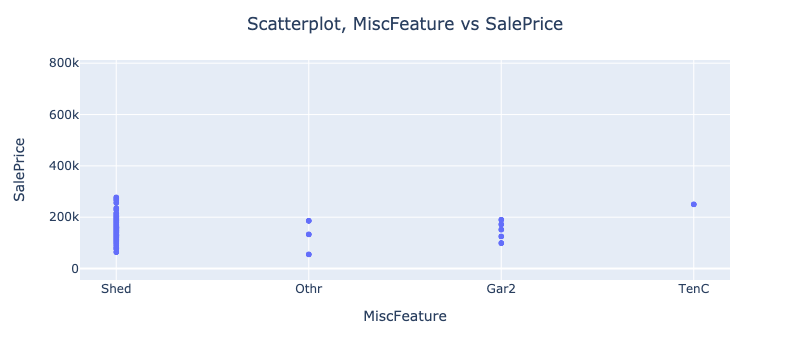

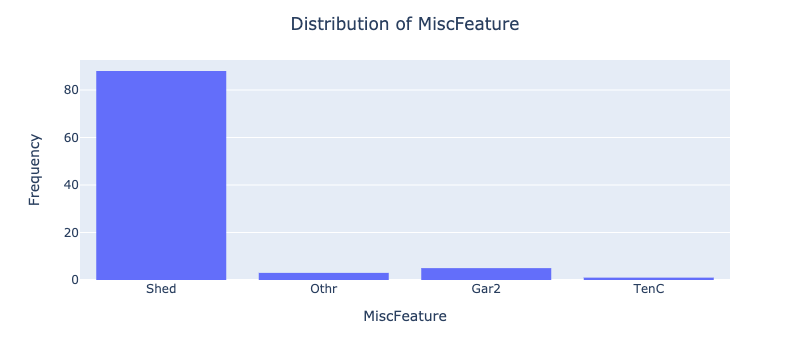

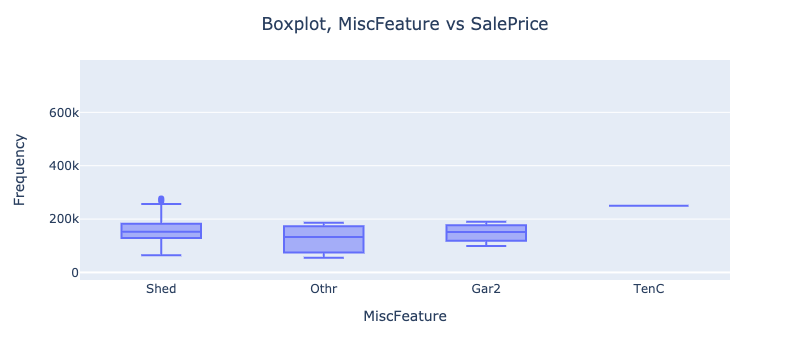

Fireplaces


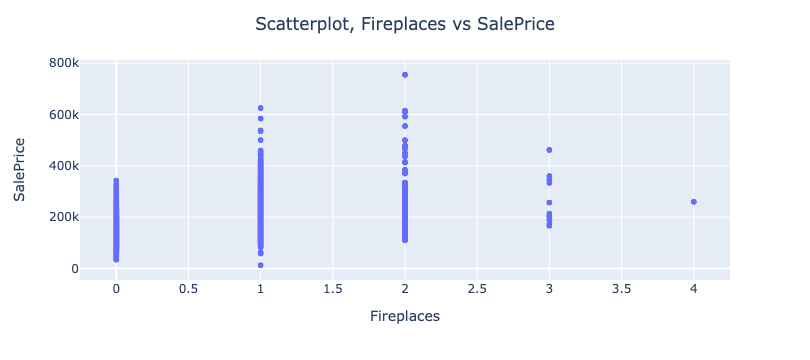

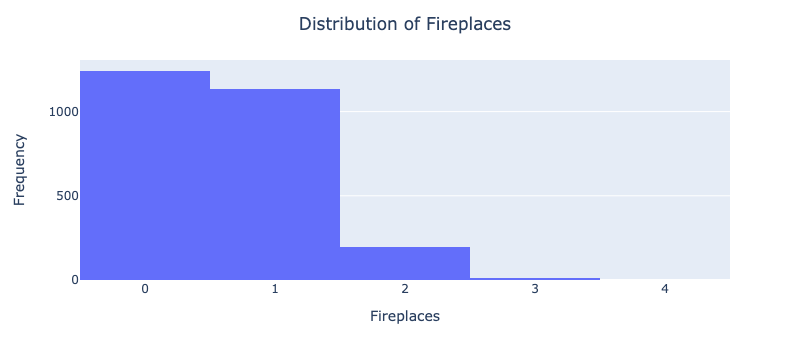

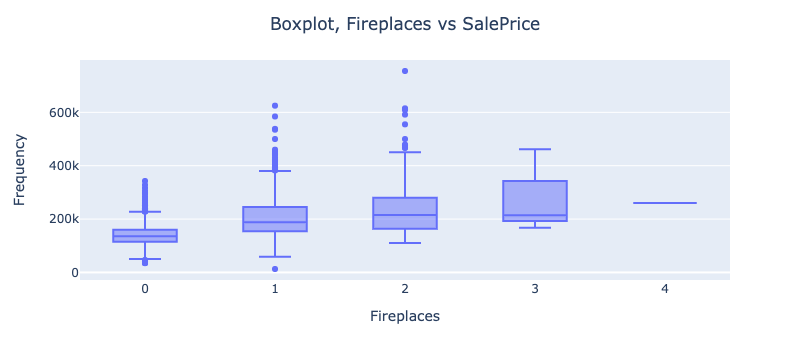

Correlation between Fireplaces and sale price is 0.48818363552363264
LinregressResult(slope=56473.49392375408, intercept=143934.74843909589, rvalue=0.48818363552363264, pvalue=1.2869427223981232e-154, stderr=1988.4072134960363, intercept_stderr=1762.4725080077628)
FireplaceQu


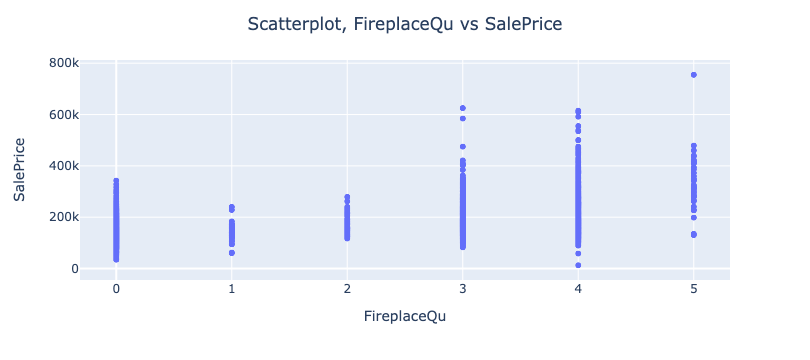

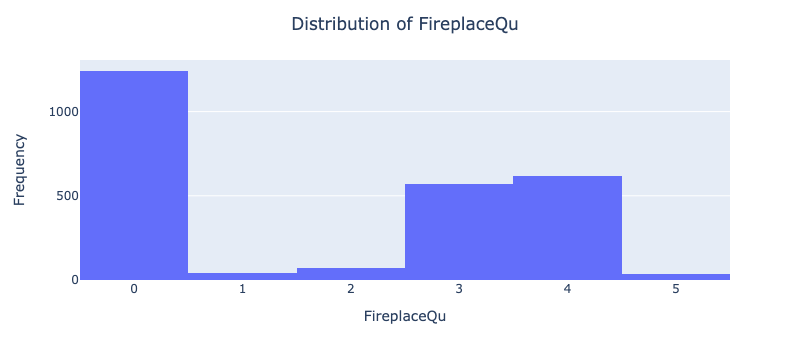

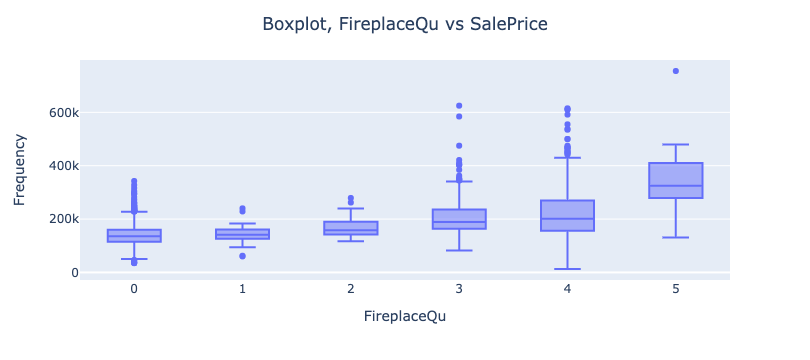

Correlation between FireplaceQu and sale price is 0.5272118792602535
LinregressResult(slope=22149.48802921428, intercept=138997.54165390506, rvalue=0.5272118792602536, pvalue=1.4629014211928928e-184, stderr=703.10465482593, intercept_stderr=1764.5615140500363)
PoolQC


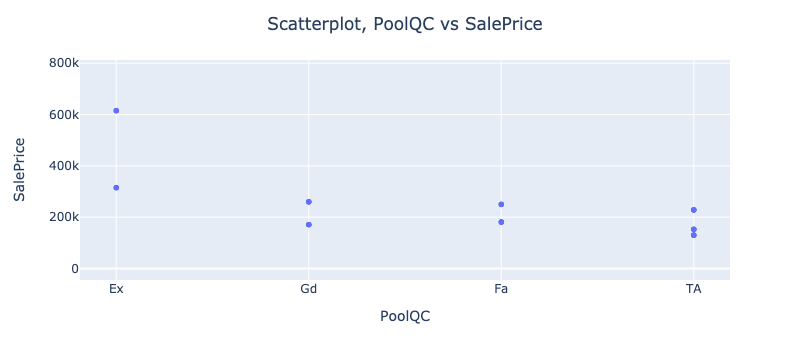

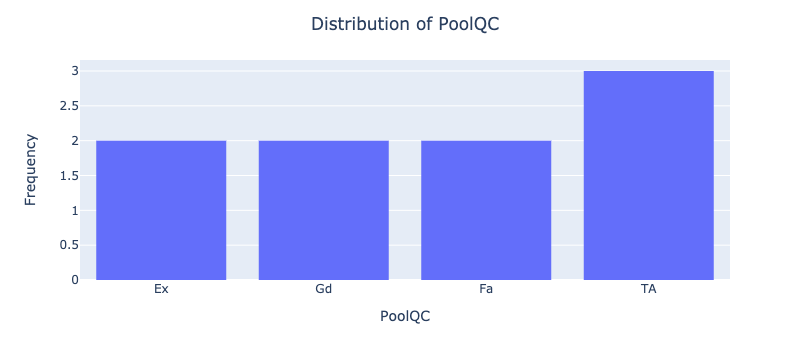

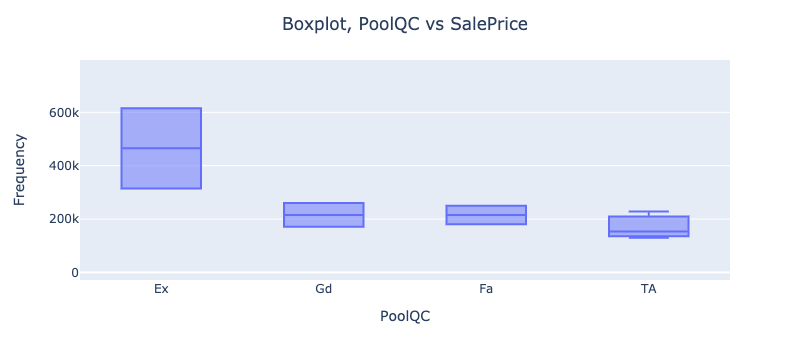

PoolArea


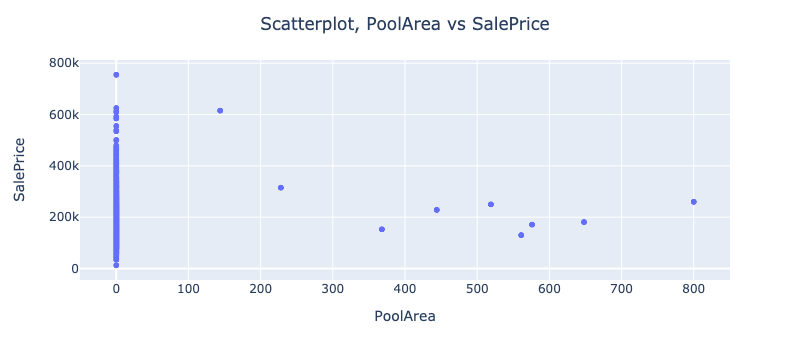

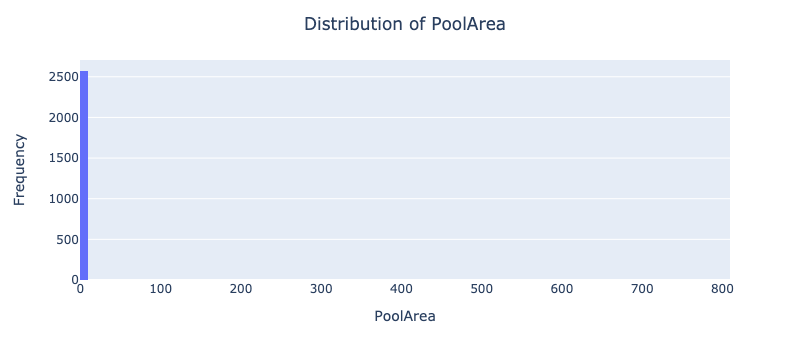

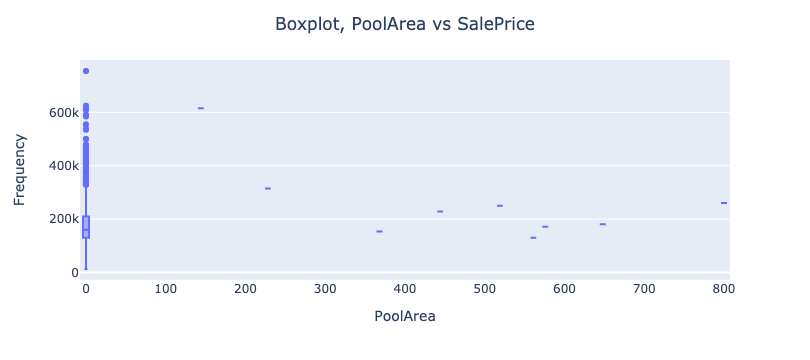

Correlation between PoolArea and sale price is 0.030844416319021007
LinregressResult(slope=76.28003290340314, intercept=177932.84465849234, rvalue=0.030844416319021004, pvalue=0.11727478200450989, stderr=48.6839907705523, intercept_stderr=1478.9716408097077)
PavedDrive


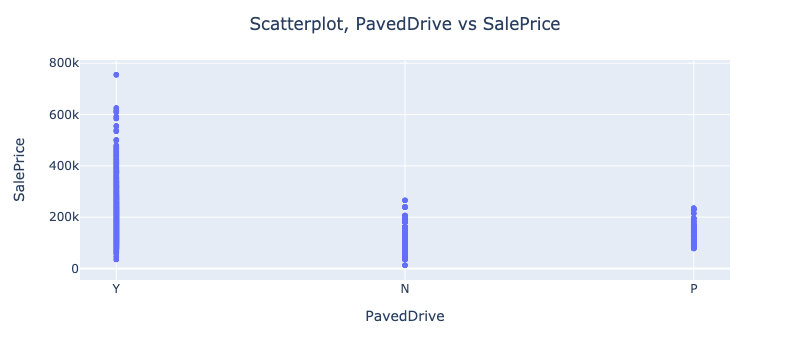

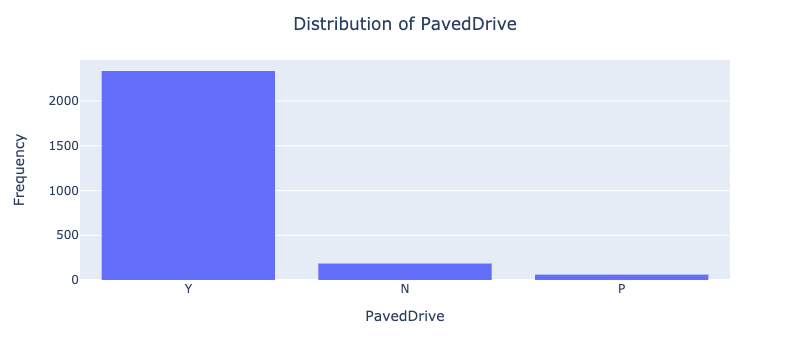

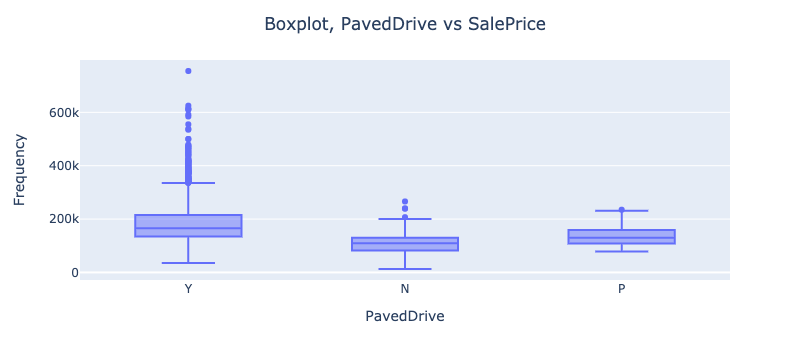

ExterQual


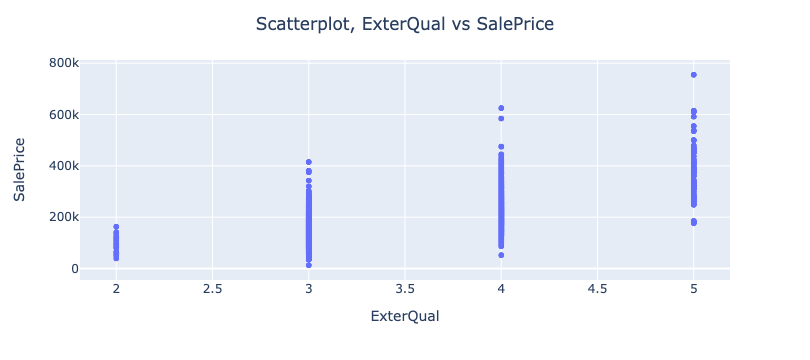

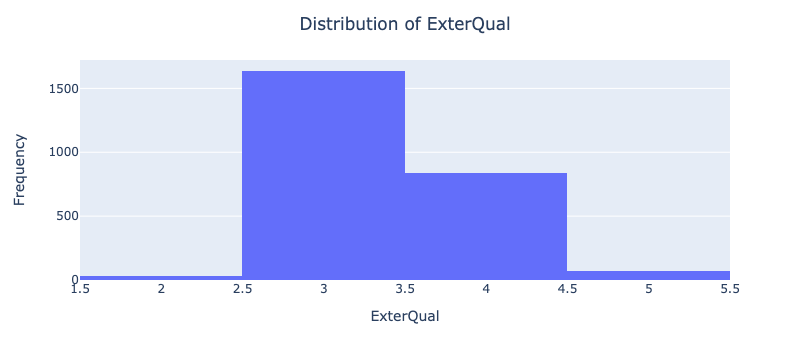

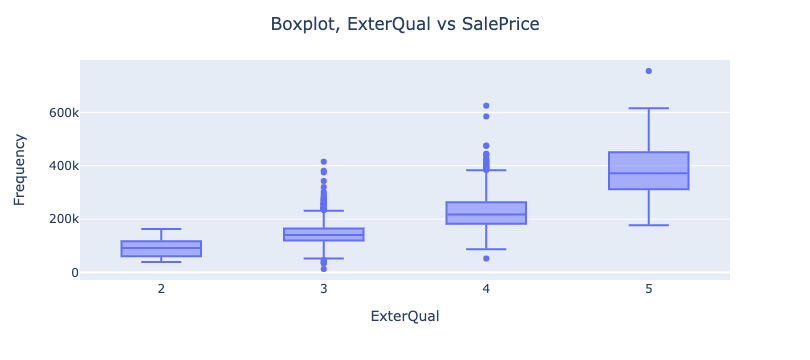

Correlation between ExterQual and sale price is 0.6824701544265758
LinregressResult(slope=91482.83064684406, intercept=-130322.61633162893, rvalue=0.6824701544265758, pvalue=0.0, stderr=1929.6584001769788, intercept_stderr=6593.774781249704)
OverallQual


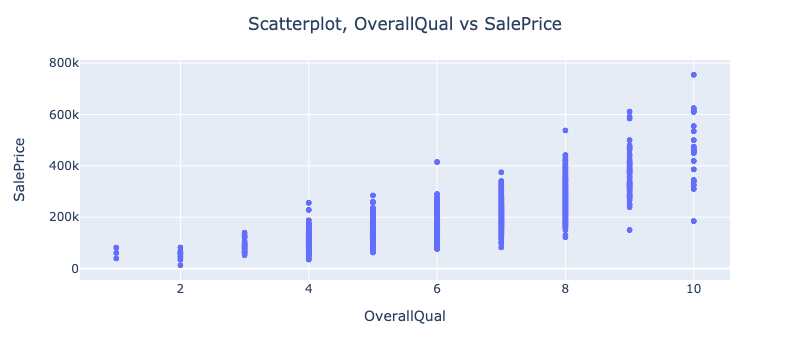

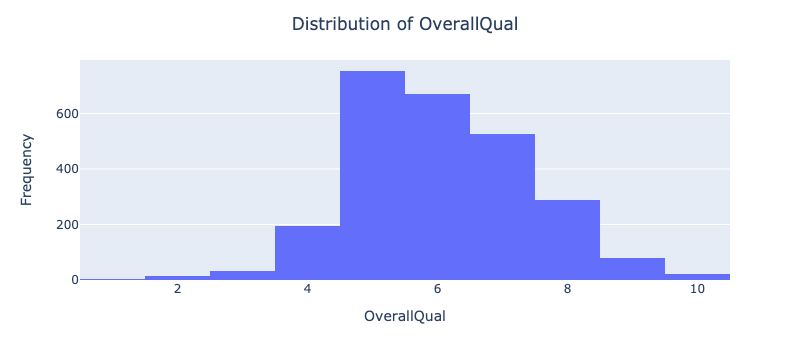

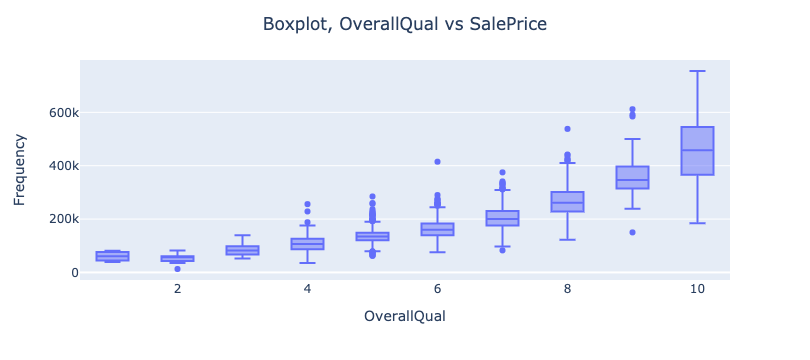

Correlation between OverallQual and sale price is 0.7905014467647514
LinregressResult(slope=43369.85246024017, intercept=-84159.88392530475, rvalue=0.7905014467647513, pvalue=0.0, stderr=661.7922413435408, intercept_stderr=4102.321608181317)
OverallCond


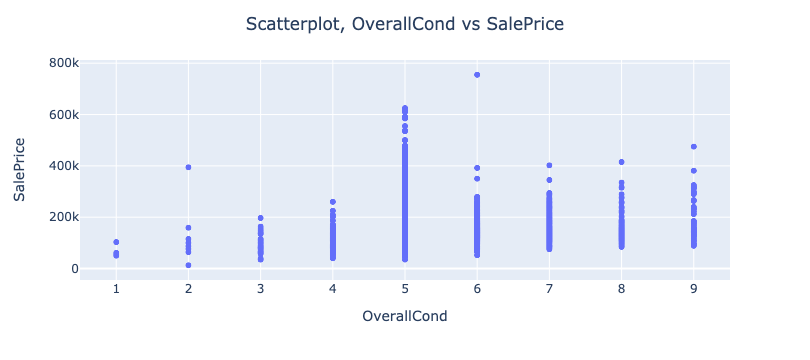

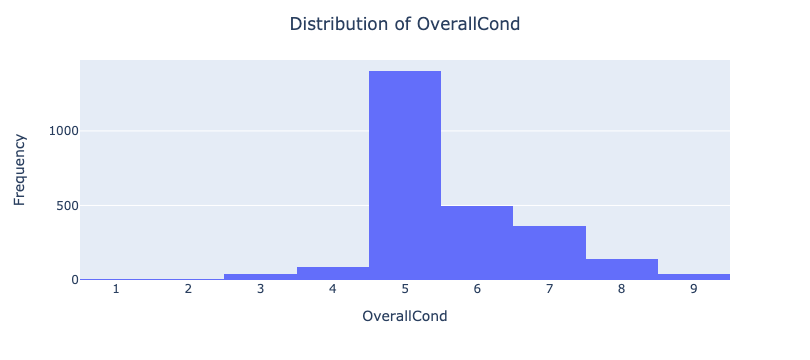

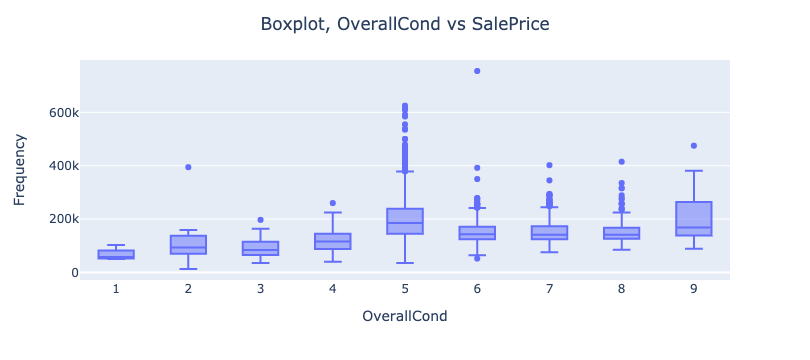

Correlation between OverallCond and sale price is -0.1010914832458746
LinregressResult(slope=-6760.206225413371, intercept=216042.54939674117, rvalue=-0.1010914832458746, pvalue=2.6679768412909925e-07, stderr=1310.3079281129933, intercept_stderr=7507.404875510869)
MiscVal


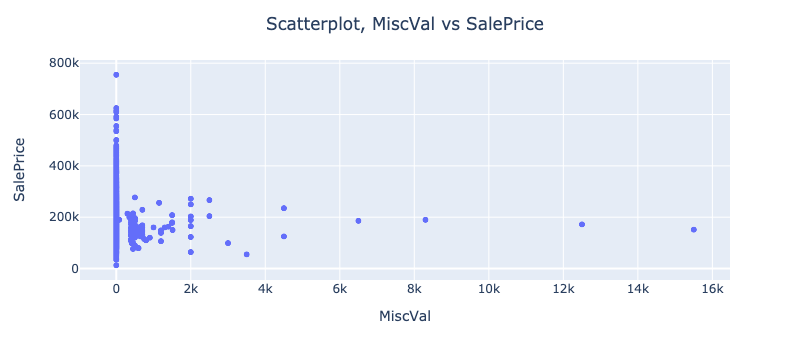

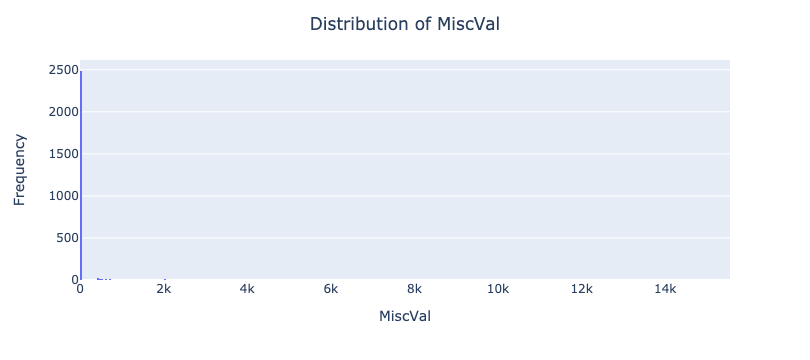

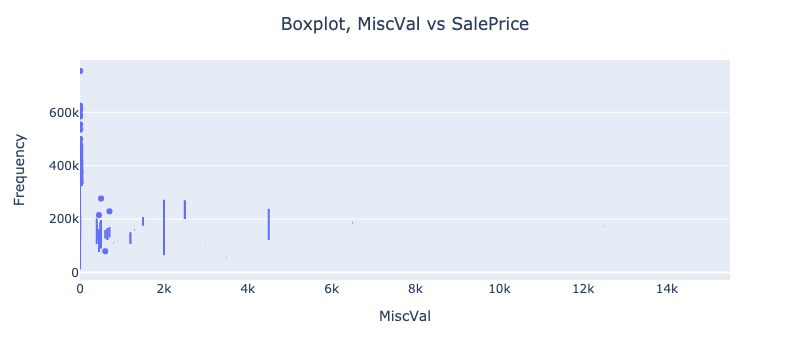

Correlation between MiscVal and sale price is -0.0188769297539784
LinregressResult(slope=-2.8399547617725536, intercept=178198.01821408272, rvalue=-0.018876929753978398, pvalue=0.3378359650640964, stderr=2.962519476556655, intercept_stderr=1484.2341632042196)
YearBuilt


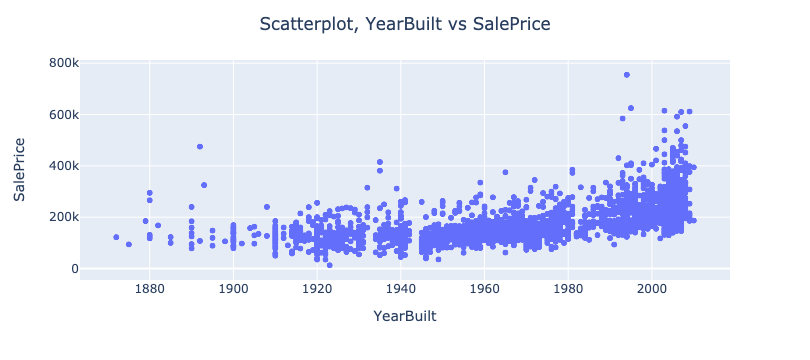

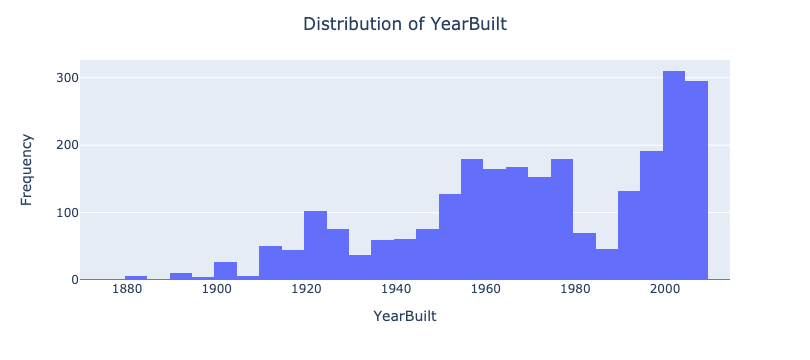

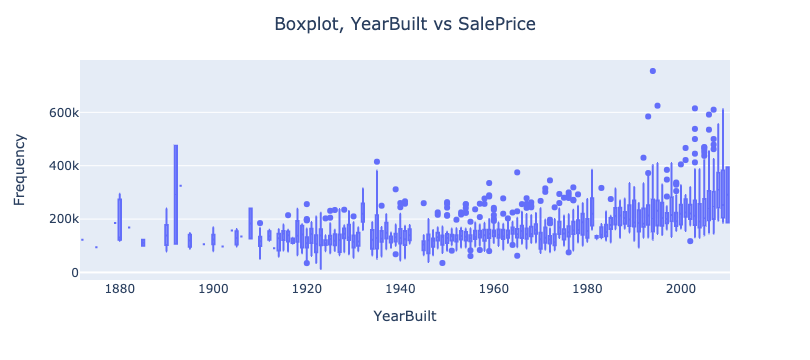

Correlation between YearBuilt and sale price is 0.5443699746148803
LinregressResult(slope=1374.3296873292036, intercept=-2529801.3363822275, rvalue=0.5443699746148805, pvalue=5.149367578162101e-199, stderr=41.70970814001376, intercept_stderr=82190.56469322441)
YearRemodAdd


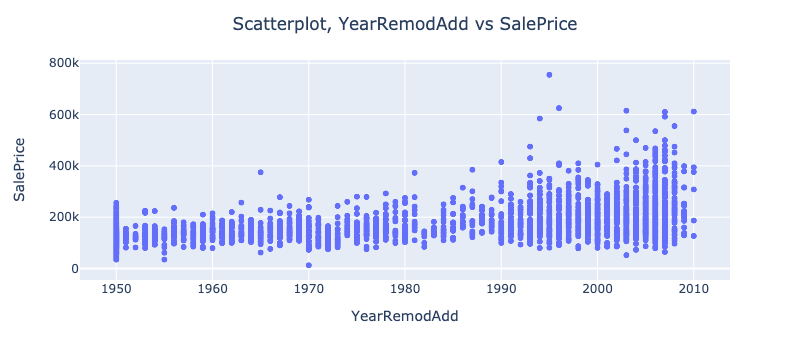

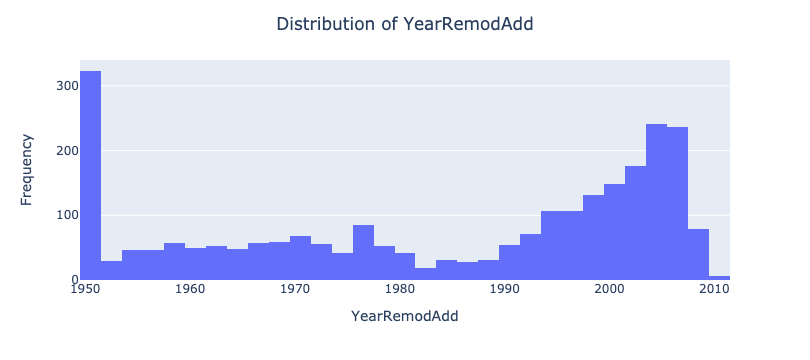

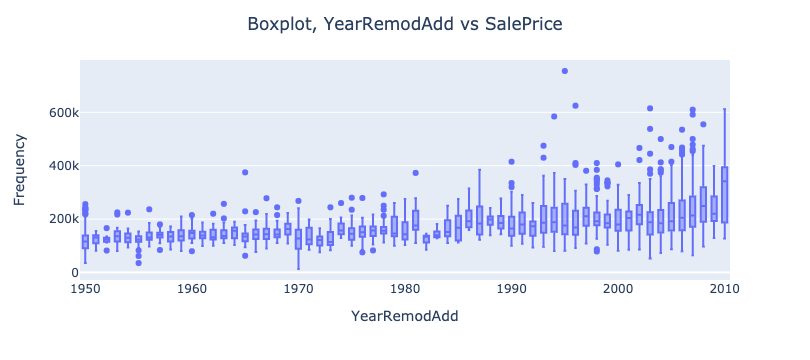

Correlation between YearRemodAdd and sale price is 0.5143087667390135
LinregressResult(slope=1883.2938246823137, intercept=-3557928.1512519596, rvalue=0.5143087667390135, pvalue=3.1575883498320765e-174, stderr=61.85004916388565, intercept_stderr=122701.6972909977)
KitchenQual


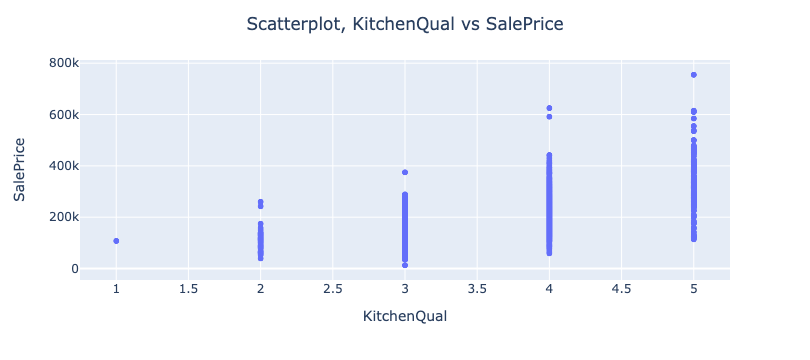

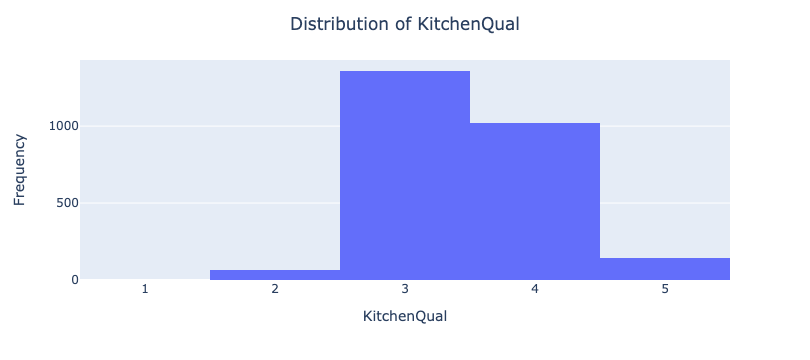

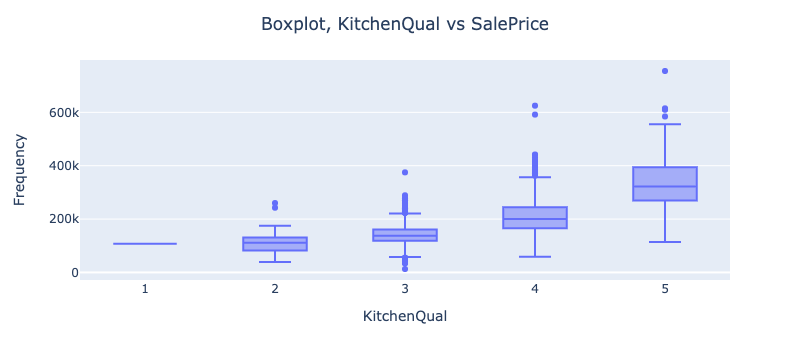

Correlation between KitchenQual and sale price is 0.6551177290345289
LinregressResult(slope=76747.04449568065, intercept=-88978.44590609503, rvalue=0.6551177290345289, pvalue=3.220361e-316, stderr=1743.2141035789002, intercept_stderr=6167.299994862971)
Fence


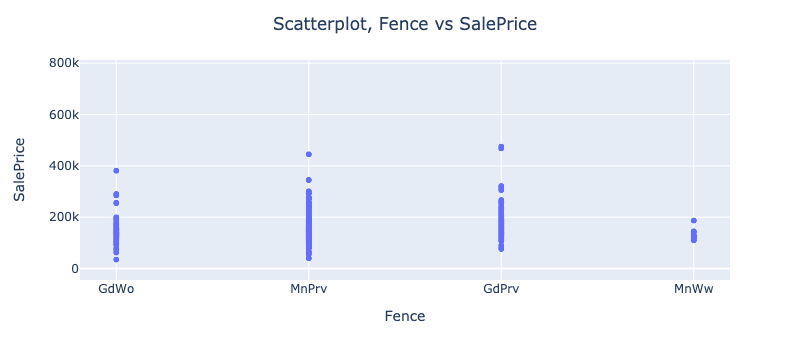

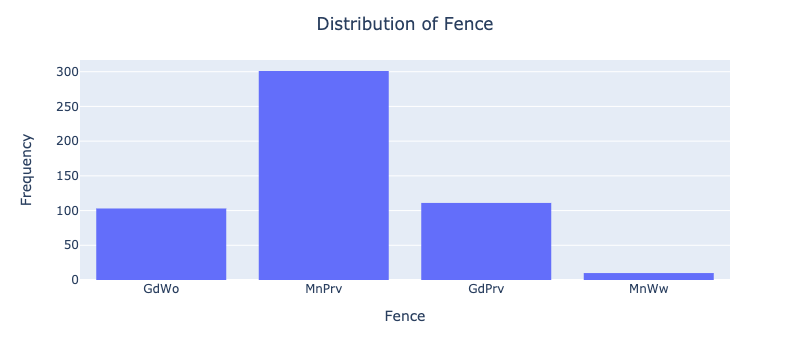

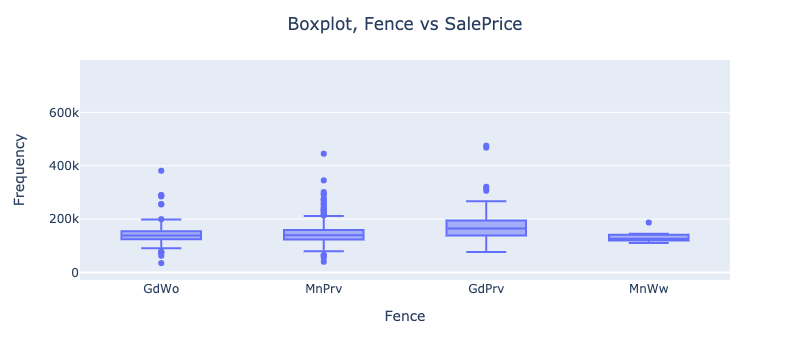

RoofStyle


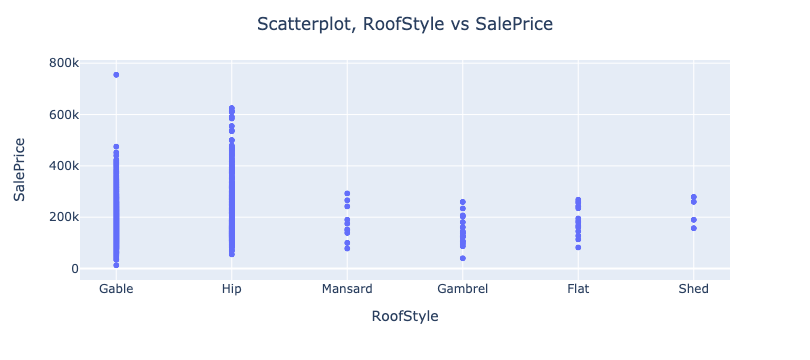

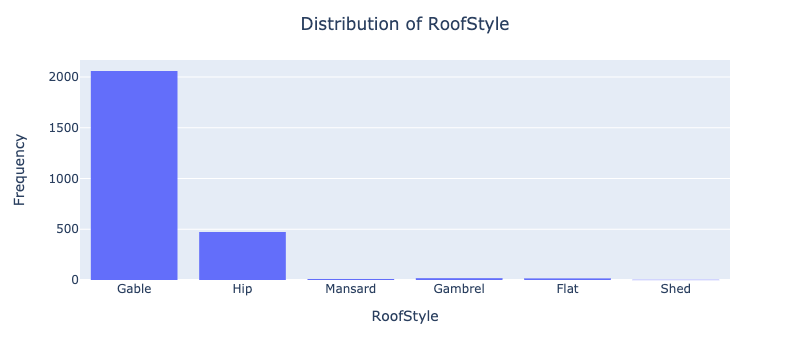

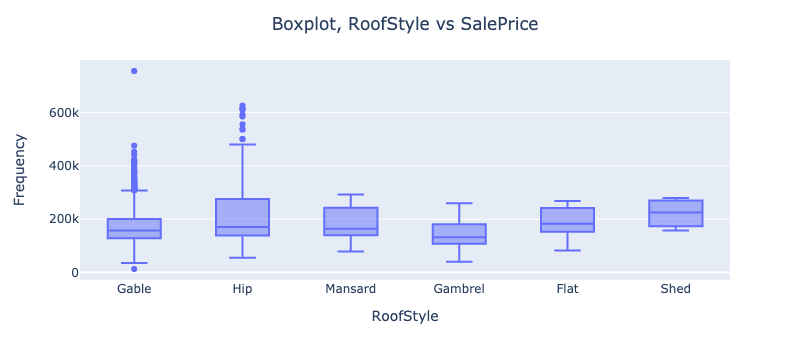

RoofMatl


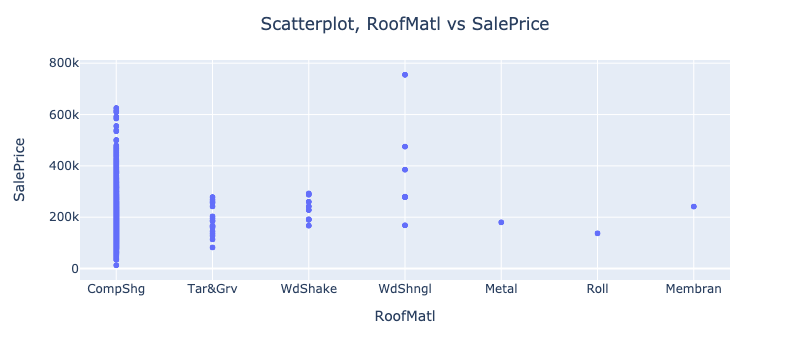

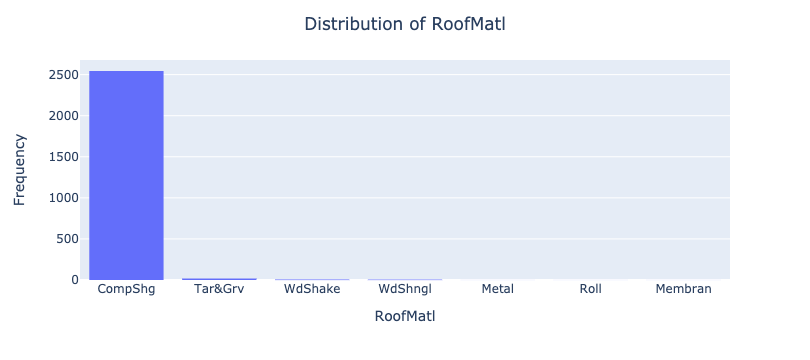

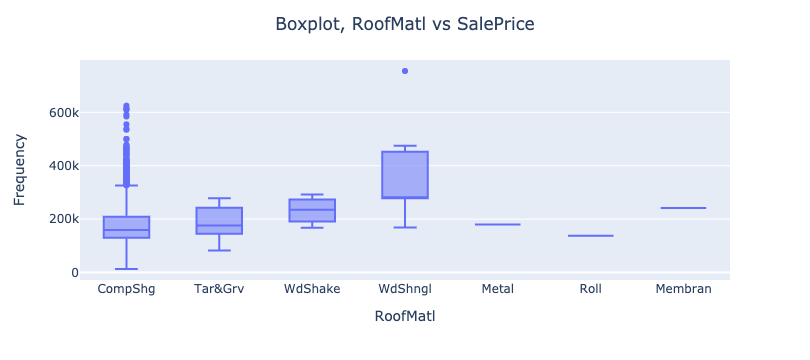

Exterior1st


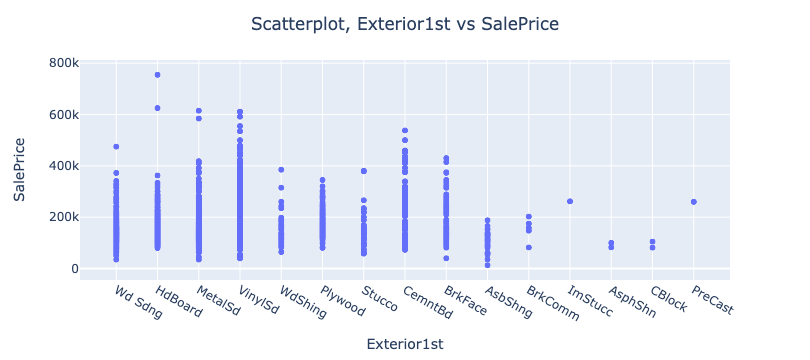

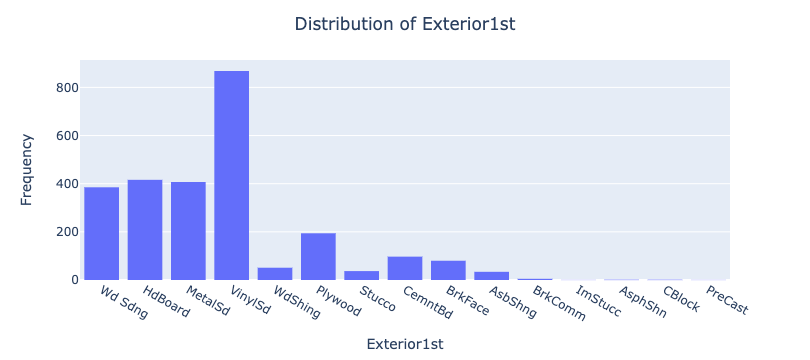

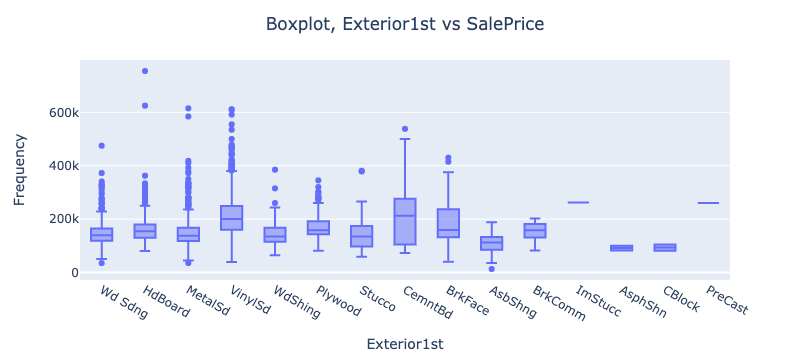

Exterior2nd


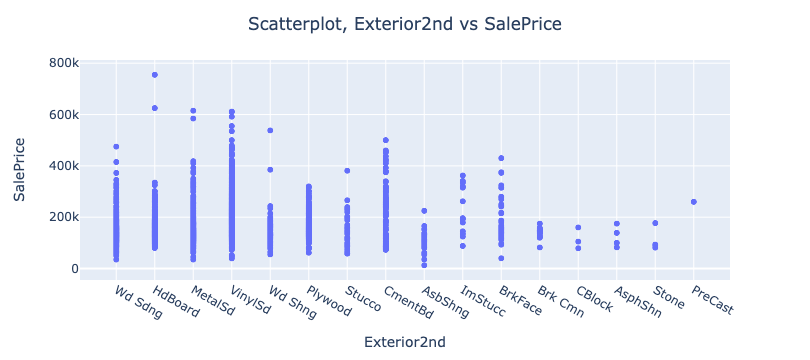

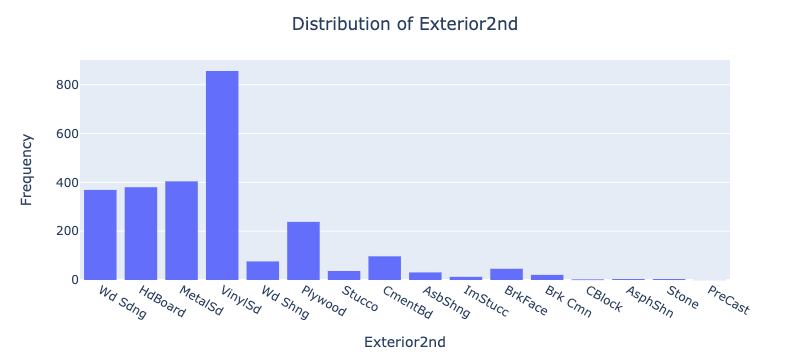

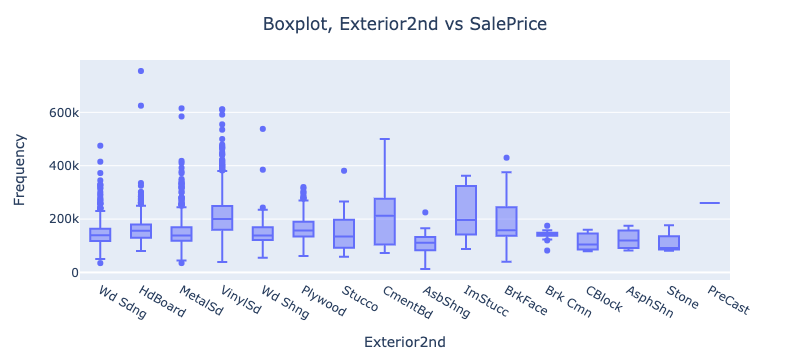

ExterCond


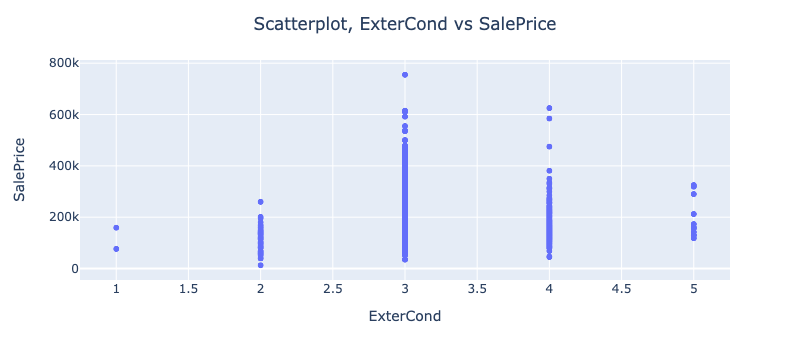

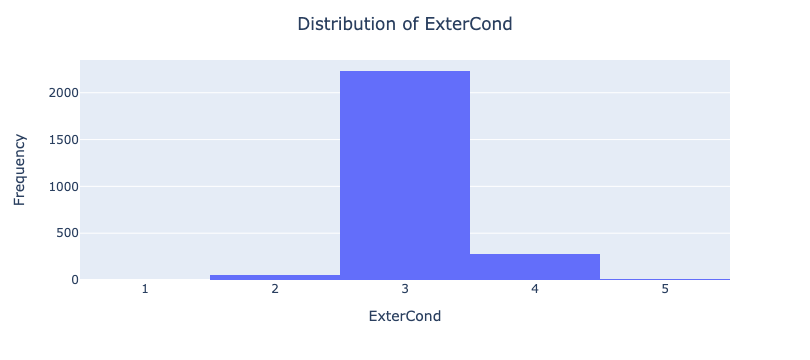

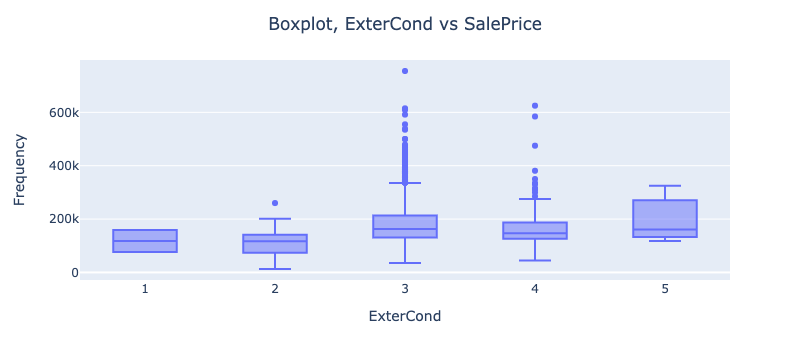

Correlation between ExterCond and sale price is 0.011270006648695161
LinregressResult(slope=2249.3108969894042, intercept=171101.58051594094, rvalue=0.011270006648695163, pvalue=0.5671959021155781, stderr=3930.576707312286, intercept_stderr=12248.313461879874)
MasVnrType


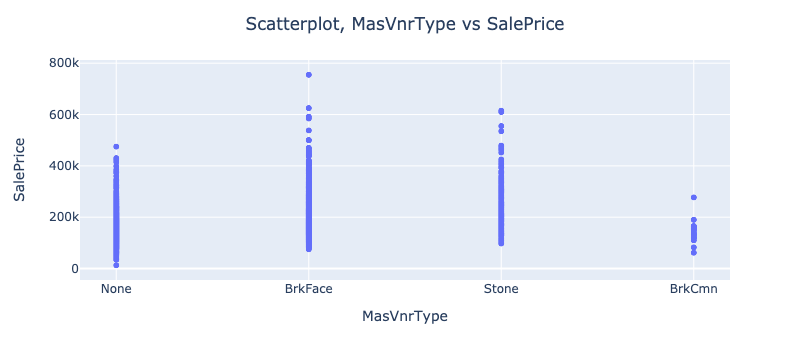

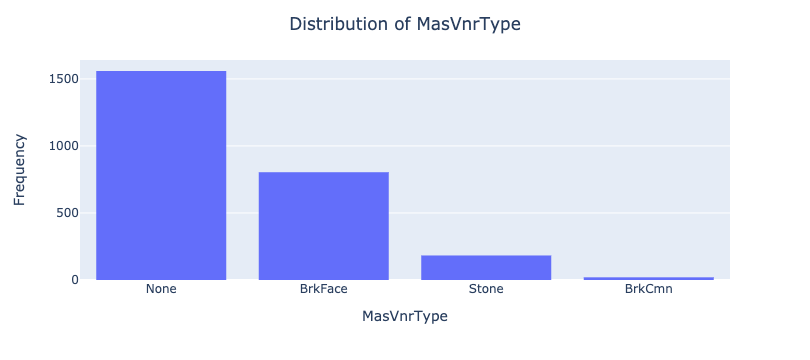

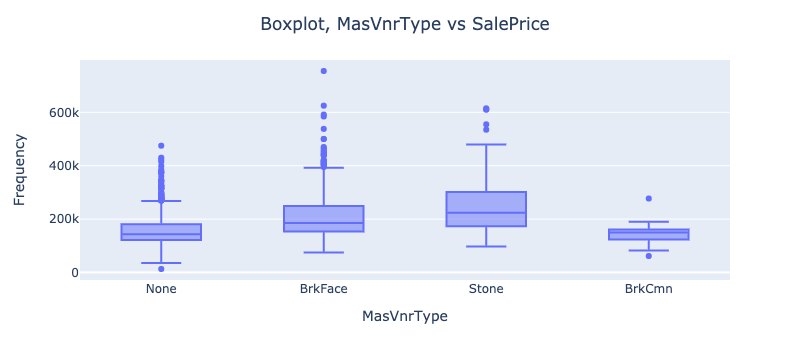

MasVnrArea


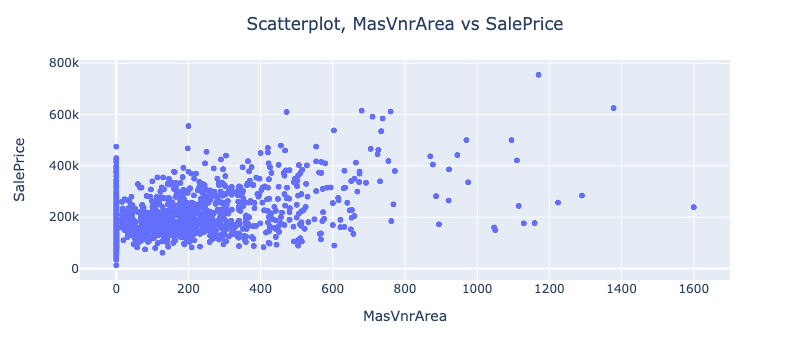

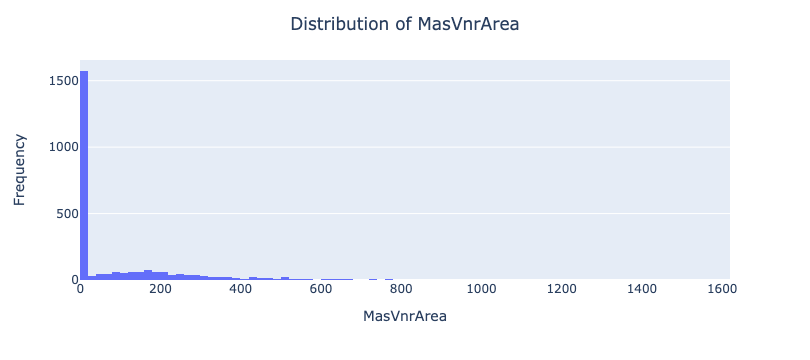

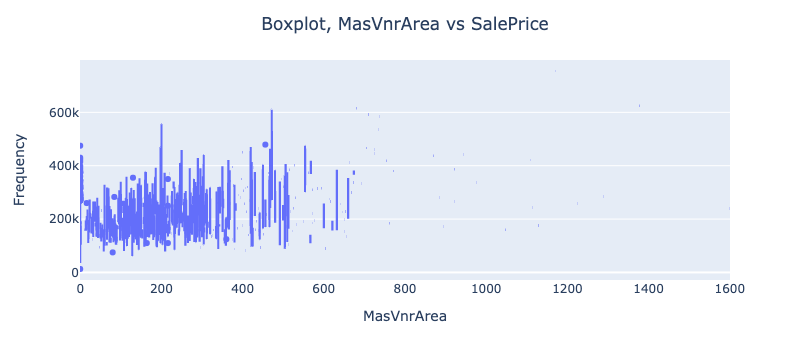

Correlation between MasVnrArea and sale price is 0.5009637970191142
LinregressResult(slope=213.95318400410915, intercept=156642.00619101827, rvalue=0.5009637970191143, pvalue=4.0647998289610835e-163, stderr=7.299692009905526, intercept_stderr=1474.1249189927307)


In [41]:
EDA_plots(df_person3)

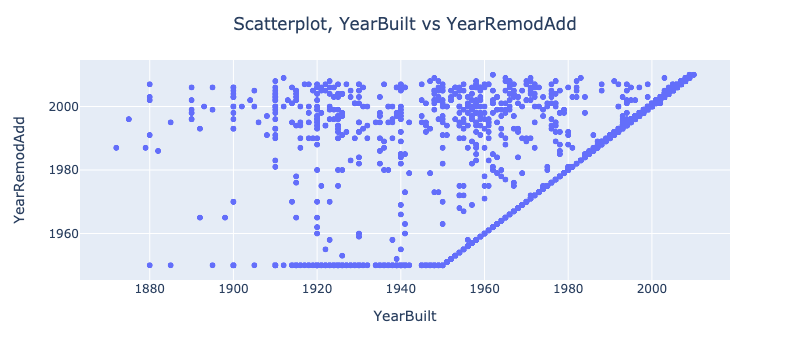

In [44]:
scatter = px.scatter(x = df['YearBuilt'], y = df['YearRemodAdd'])
scatter.update_layout(
                title={
                    'text': 'Scatterplot, YearBuilt vs YearRemodAdd',
                    'y':0.95,
                    'x':0.5,
                    'xanchor': 'center',
                    'yanchor': 'top'},
                xaxis_title = 'YearBuilt',
                yaxis_title = 'YearRemodAdd'
            )


feature:  KitchenQual


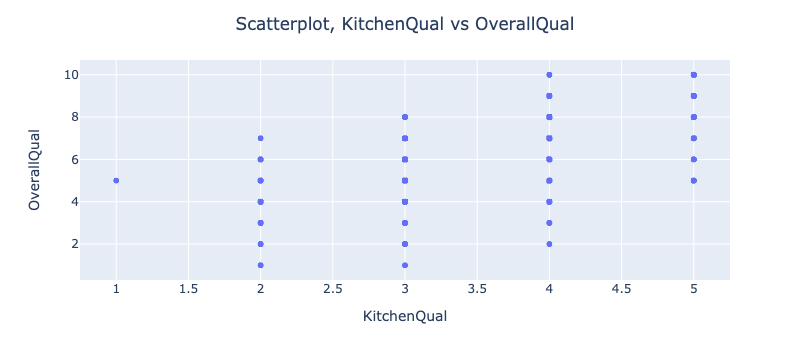

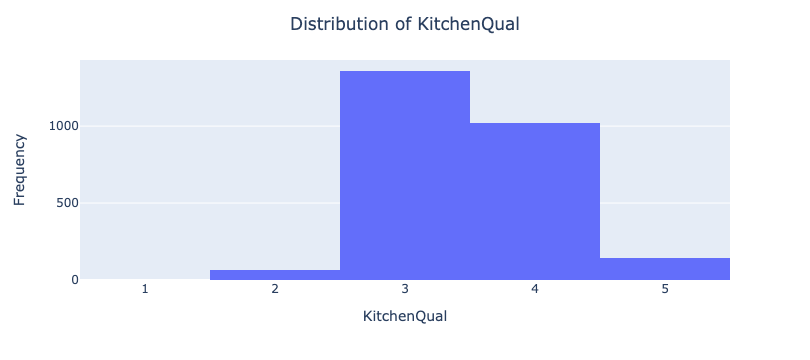

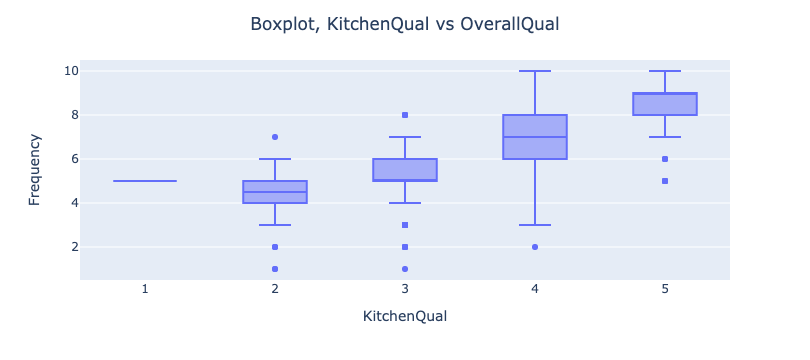

Correlation between KitchenQual and OverallQual is 0.6538195980927451
LinregressResult(slope=1.396094981664543, intercept=1.188471065735425, rvalue=0.6538195980927451, pvalue=1.488237133e-314, stderr=0.031820784405969596, intercept_stderr=0.11257843950468562)
r^2 =  0.42748006685015877

feature:  KitchenQual


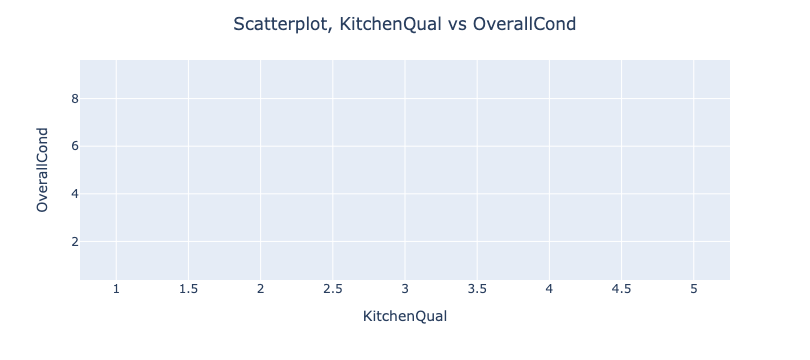

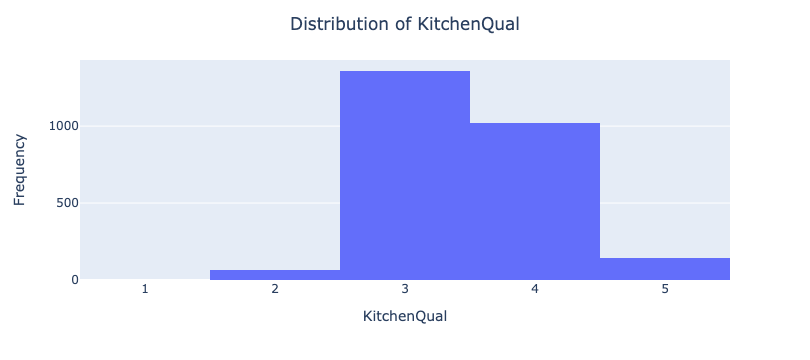

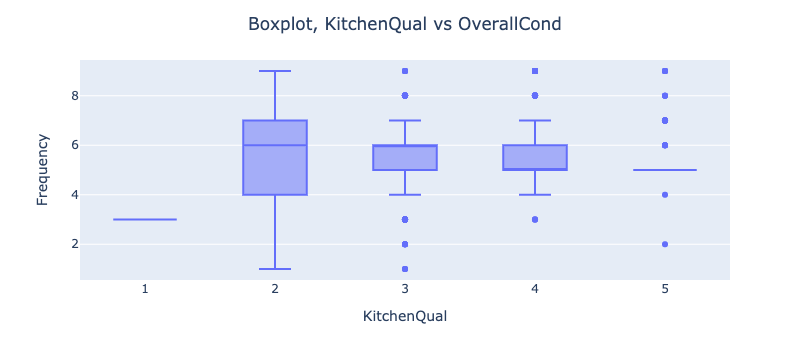

Correlation between KitchenQual and OverallCond is -0.0502961526253491
LinregressResult(slope=-0.08811131778980882, intercept=5.925184224728339, rvalue=-0.0502961526253491, pvalue=0.010615520968559609, stderr=0.03445922143447418, intercept_stderr=0.1219129398617762)
r^2 =  0.0025297029689124112

feature:  YearRemodAdd


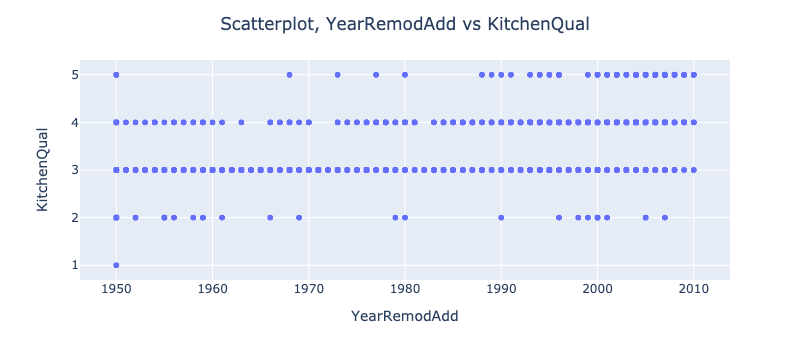

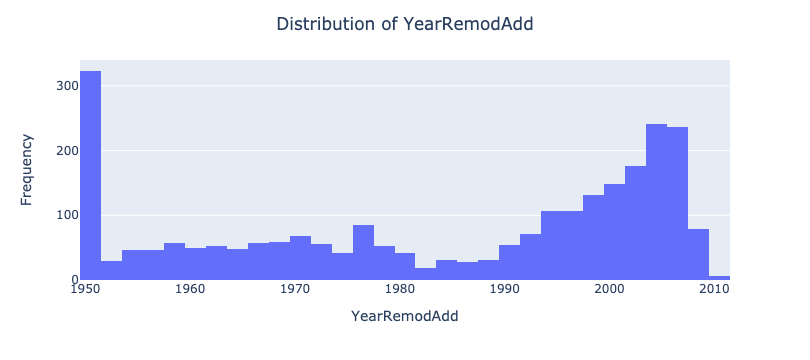

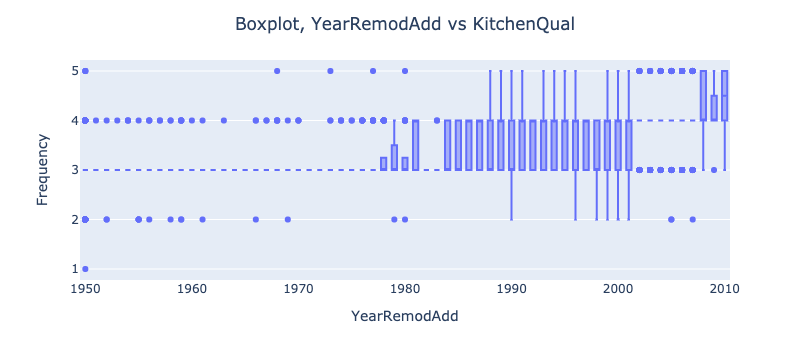

Correlation between YearRemodAdd and KitchenQual is 0.5990166629056323
LinregressResult(slope=0.018723660213627223, intercept=-33.663639870605124, rvalue=0.5990166629056323, pvalue=4.1195966766726686e-251, stderr=0.0004929467968781963, intercept_stderr=0.9779363067415784)
r^2 =  0.3588209624385999

feature:  YearRemodAdd


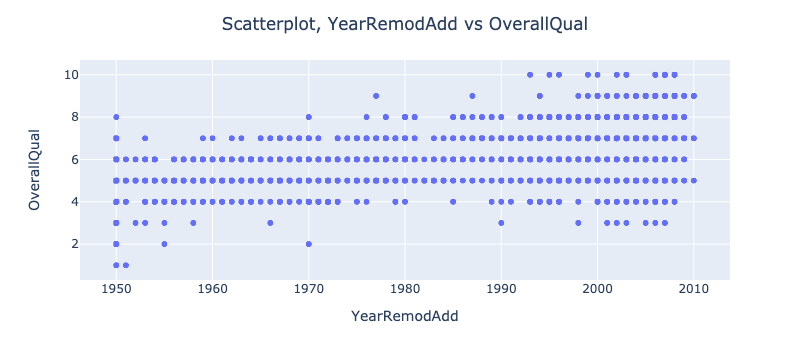

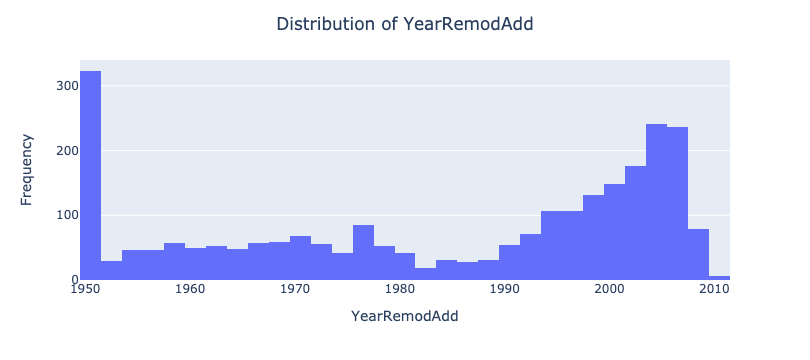

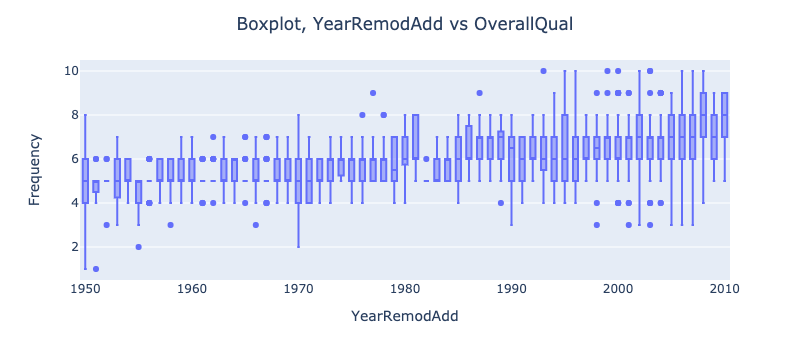

Correlation between YearRemodAdd and OverallQual is 0.5462965299878466
LinregressResult(slope=0.03646173425365955, intercept=-66.28491195696506, rvalue=0.5462965299878466, pvalue=1.0865915416331566e-200, stderr=0.0011010318041281707, intercept_stderr=2.184290440577048)
r^2 =  0.2984398986767622

feature:  YearRemodAdd


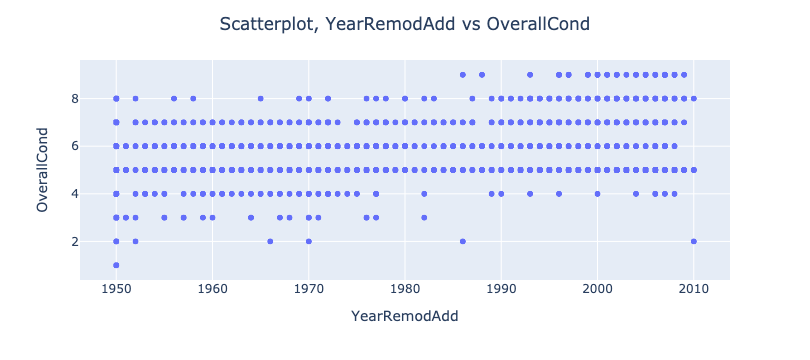

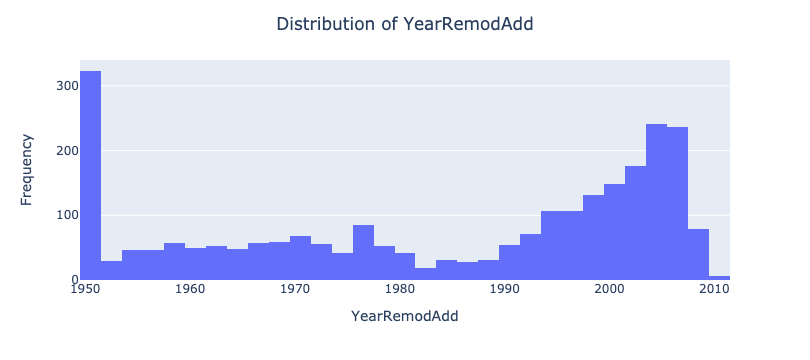

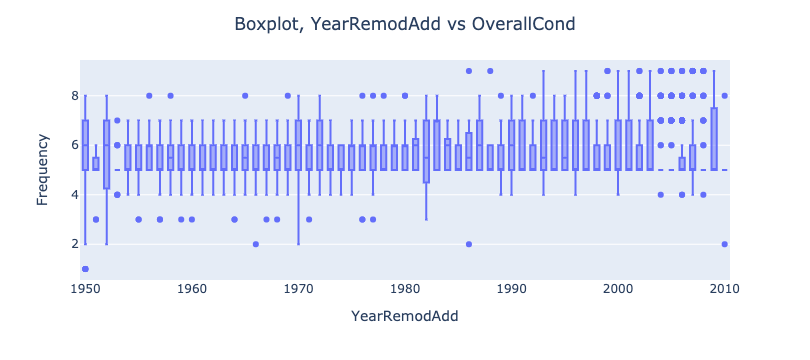

Correlation between YearRemodAdd and OverallCond is 0.06510023005248046
LinregressResult(slope=0.003564768261426189, intercept=-1.453011295907035, rvalue=0.06510023005248046, pvalue=0.0009376734685370896, stderr=0.0010761804253006494, intercept_stderr=2.1349888409278934)
r^2 =  0.00423803995288588

feature:  YearBuilt


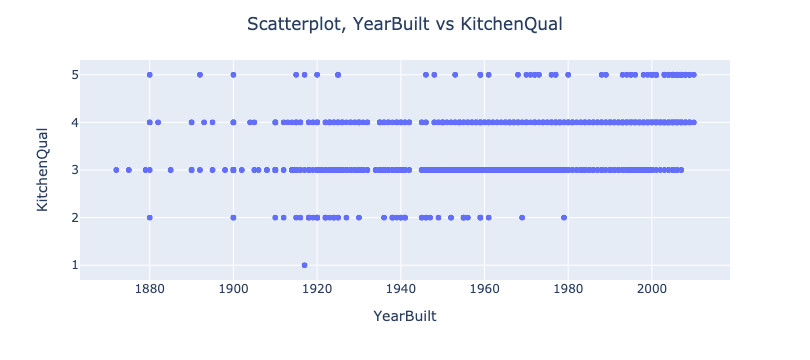

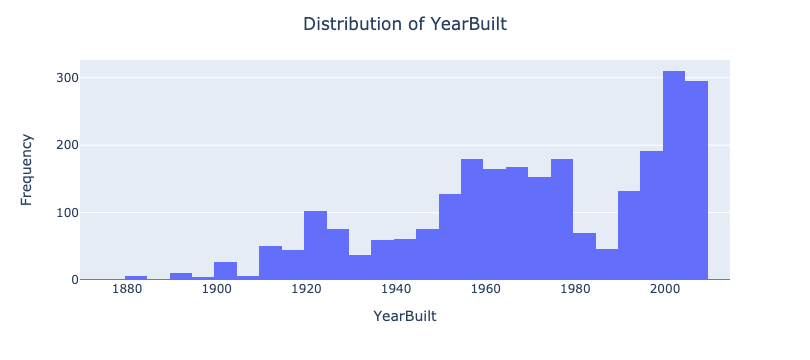

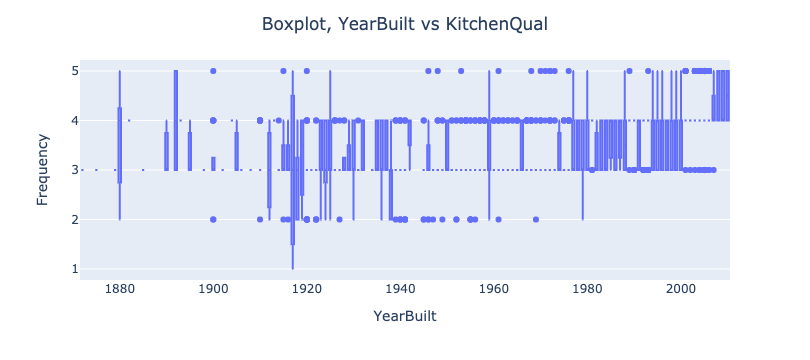

Correlation between YearBuilt and KitchenQual is 0.5104611738526785
LinregressResult(slope=0.01100062023883641, intercept=-18.195218189264885, rvalue=0.5104611738526784, pvalue=3.130938605538697e-171, stderr=0.0003649735191865368, intercept_stderr=0.7191941871019033)
r^2 =  0.26057061001105436

feature:  YearBuilt


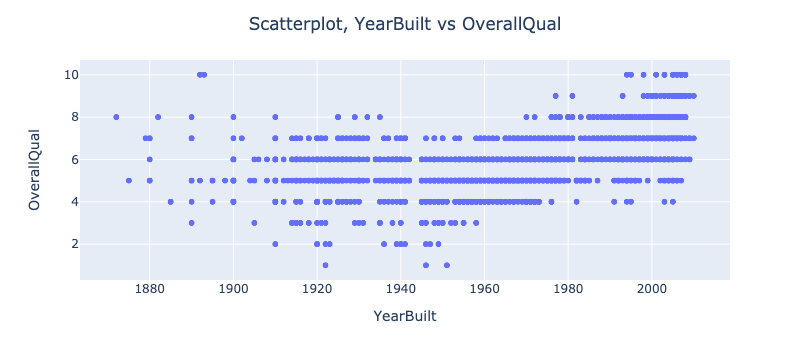

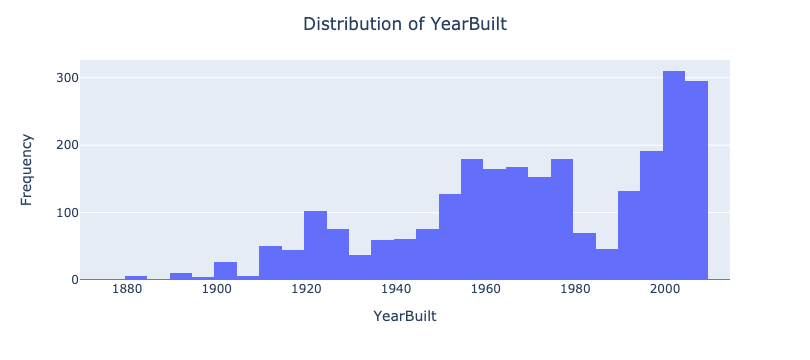

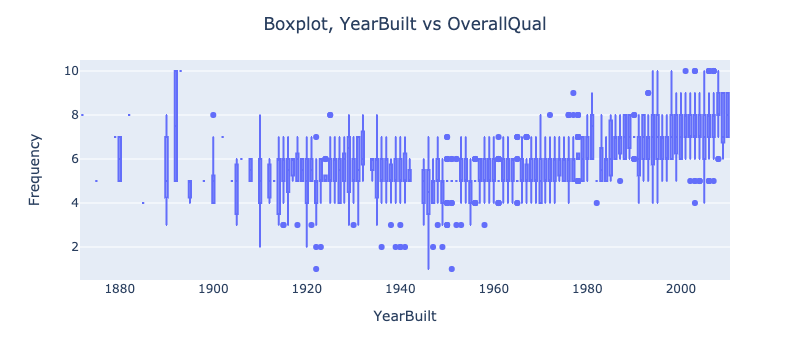

Correlation between YearBuilt and OverallQual is 0.5743997224966636
LinregressResult(slope=0.026431737378178482, intercept=-46.03269694015747, rvalue=0.5743997224966635, pvalue=2.0016778997038114e-226, stderr=0.0007418711562343771, intercept_stderr=1.4618853015186466)
r^2 =  0.32993504120424405

feature:  YearBuilt


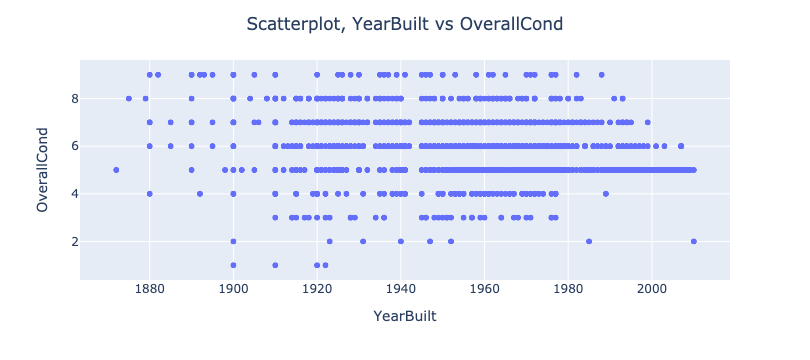

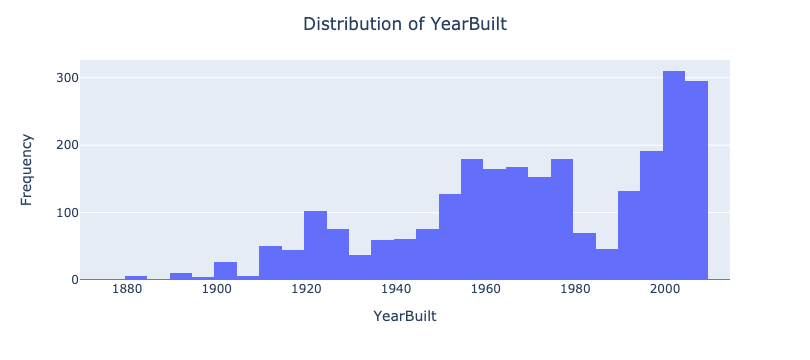

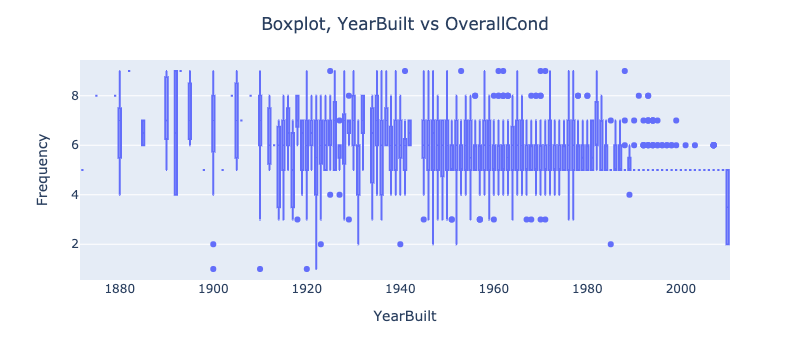

Correlation between YearBuilt and OverallCond is -0.39727442385728595
LinregressResult(slope=-0.014998298587670034, intercept=35.16996163703401, rvalue=-0.3972744238572859, pvalue=2.7452834282465335e-98, stderr=0.0006823553445994167, intercept_stderr=1.3446071333273848)
r^2 =  0.15782696785113845

feature:  OverallQual


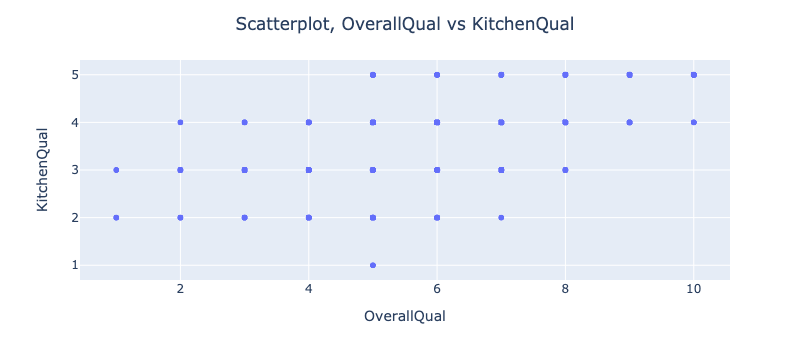

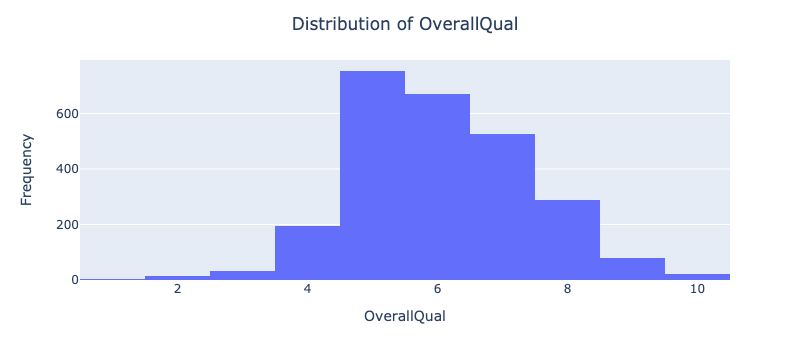

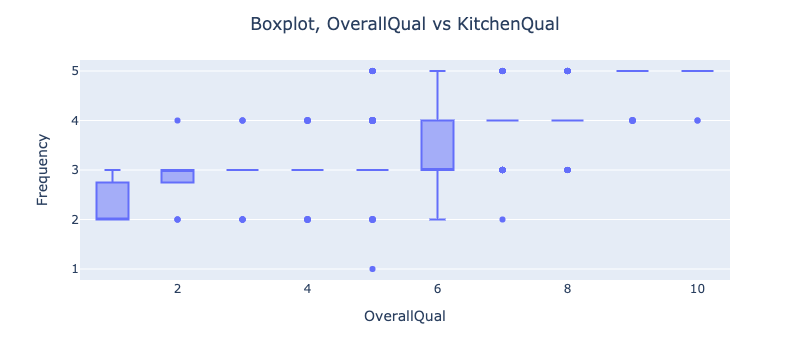

Correlation between OverallQual and KitchenQual is 0.6538195980927451
LinregressResult(slope=0.30619697976457216, intercept=1.6281524467645112, rvalue=0.6538195980927451, pvalue=1.488237133e-314, stderr=0.006979058163528777, intercept_stderr=0.0432618264772556)
r^2 =  0.42748006685015877


feature:  OverallQual


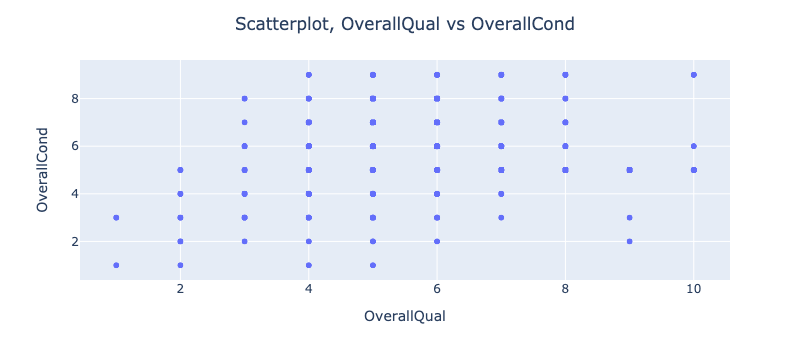

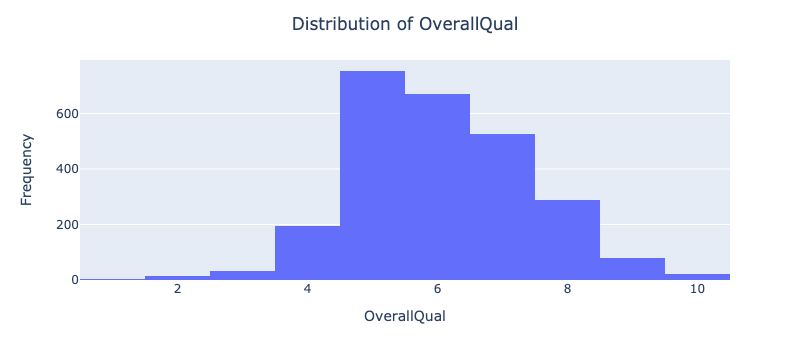

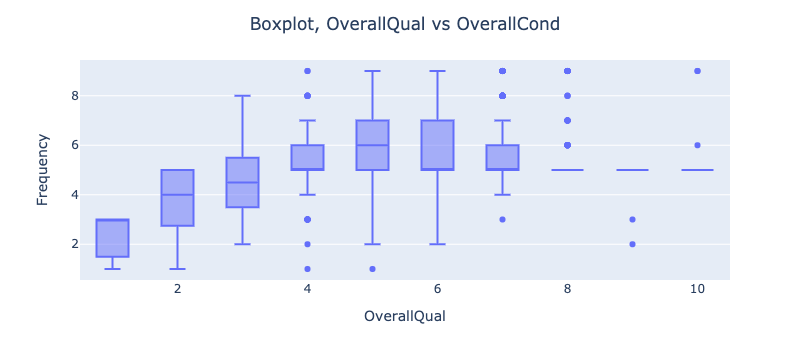

Correlation between OverallQual and OverallCond is -0.09592658258181404
LinregressResult(slope=-0.07870075025760051, intercept=6.094439148553609, rvalue=-0.09592658258181404, pvalue=1.053540351307458e-06, stderr=0.016083887387048922, intercept_stderr=0.09970089500821816)
r^2 =  0.009201909245825588

feature:  OverallCond


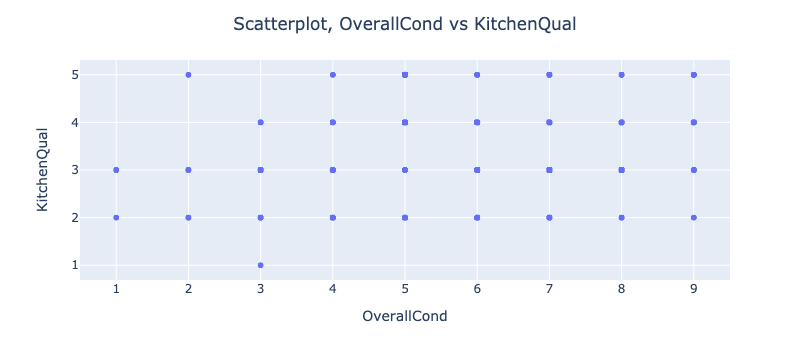

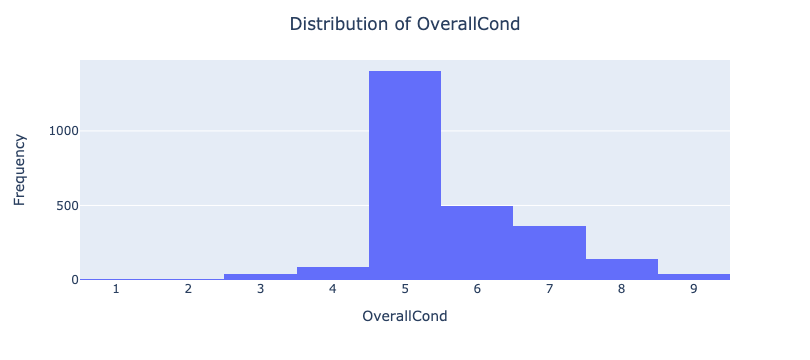

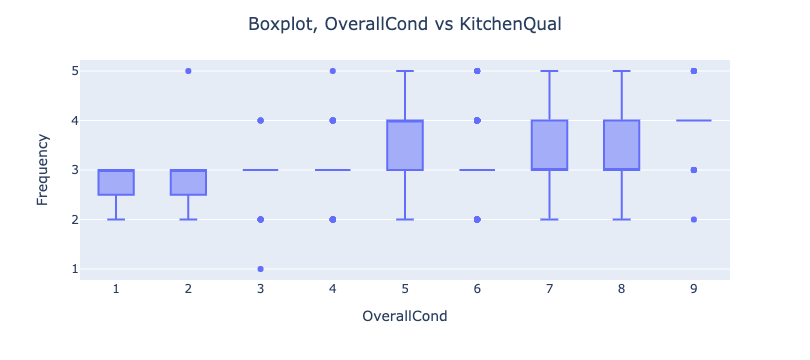

Correlation between OverallCond and KitchenQual is -0.05029615262534911
LinregressResult(slope=-0.028710306829674986, intercept=3.640769227830608, rvalue=-0.050296152625349096, pvalue=0.01061552096855963, stderr=0.01122823770330553, intercept_stderr=0.06433215022867647)
r^2 =  0.002529702968912411

feature:  OverallCond


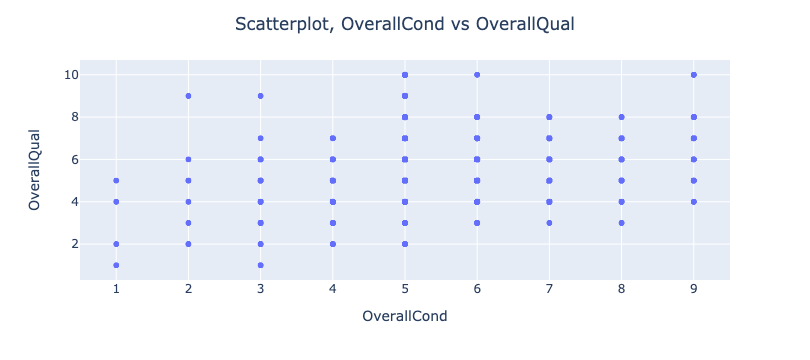

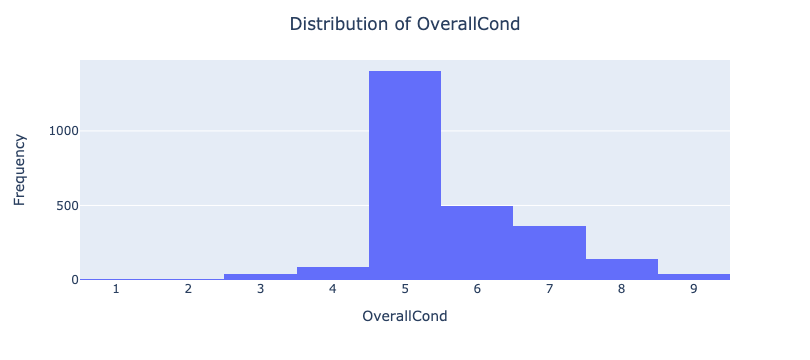

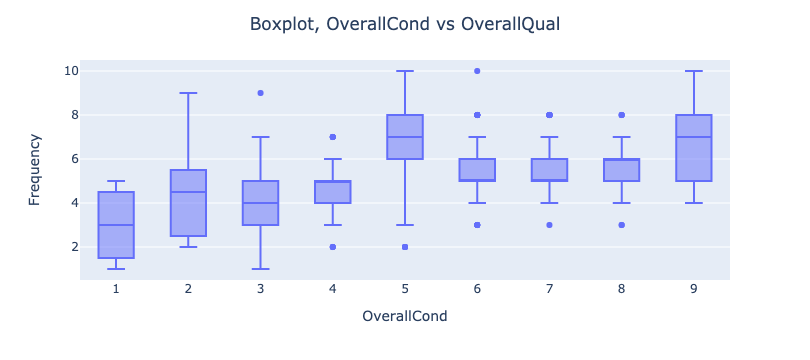

Correlation between OverallCond and OverallQual is -0.09592658258181404
LinregressResult(slope=-0.1169227639597618, intercept=6.703066816418879, rvalue=-0.09592658258181404, pvalue=1.053540351307458e-06, stderr=0.023895230507407966, intercept_stderr=0.13690764297756808)
r^2 =  0.009201909245825588




In [45]:
EDA_plots(df_person3, ['KitchenQual', 'YearRemodAdd', 'YearBuilt', 'OverallQual', 'OverallCond'], ['KitchenQual', 'OverallQual', 'OverallCond'])